In [82]:
import math
import random

import cv2
import numpy as np
import matplotlib.pyplot as plt


In [243]:
import numpy
import torch
from torch.utils.data import Dataset,DataLoader
import torchvision.transforms as transforms
import cv2
from PIL import Image
import os
import re
import matplotlib.pyplot as plt
import numpy as np

def xywh2xyxy(x):
    # Convert nx4 boxes from [x, y, w, h] to [x1, y1, x2, y2] where xy1=top-left, xy2=bottom-right
    y = x.clone() if isinstance(x, torch.Tensor) else np.copy(x)
    y[:, 0] = x[:, 0] - x[:, 2] / 2  # top left x
    y[:, 1] = x[:, 1] - x[:, 3] / 2  # top left y
    y[:, 2] = x[:, 0] + x[:, 2] / 2  # bottom right x
    y[:, 3] = x[:, 1] + x[:, 3] / 2  # bottom right y
    return y

def batch(img, label):
    lbl = []
    name = []
    iml = []
    for val in os.listdir(label):
        if val.endswith('txt'):
            lbl.append(label + val)
            n = val.split('/')[-1][:-4]
            name.append(n)
    for val in os.listdir(img):
        if val.endswith('jpg') or val.endswith('tif'):
            n = val.split('/')[-1][:-4]
            if n in name:
                iml.append(img + val)
                
    lbl = sorted(lbl)
    iml = sorted(iml)
    return iml, lbl
            

def cropimg(img, label):
    img = cv2.imread(img)

    file = open(label, 'r').readlines()
    lb = []
    im = []
    for line in file:
        cls, x,y, w,h = line.split(' ')
        x,y,w,h = float(x),float(y),float(w),float(h.replace('\n',''))
        w = w * img.shape[1]
        h = h * img.shape[0]
        x = x * img.shape[1]
        y = y * img.shape[0]
        x1 = max(int(x - w/2), 0)
        y1 = max(int(y - h/2), 0)
        x2 = min(int(x + w/2), img.shape[1])
        y2 = min(int(y + h/2), img.shape[0])
        lb.append(cls)
#         print(x1,x2,y1,y2)
        crop = img[y1:y2,x1:x2,:]
#         print(crop)
        im.append(crop)
    return im, lb
    
    
class ImageDataset(Dataset):
    def __init__(self, imagePath, labelPath, cache_path='./', prefix='train'):
        super(ImageDataset, self).__init__()
        self.img_size = 128
        self.imagePath = imagePath
        self.labelPath = labelPath


        p_im, p_lb = batch(self.imagePath, self.labelPath)
        img_list, lb_list = [], []
        if os.path.exists(cache_path + prefix + '.npy'):
    
            cache = np.load(cache_path + prefix + '.npy', allow_pickle=True).item()
            self.img_list = cache['img']
            self.lb_list = cache['lb']
        else:
            cachex = {}
            for i,j in zip(p_im, p_lb):
                x, y = cropimg(i,j)
                for m,n in zip(x,y):
                    img_list.append(m)
                    lb_list.append(n)
 
            
            cachex['img'] = img_list
            cachex['lb'] = lb_list
            np.save(cache_path + prefix + '.npy', cachex)
            self.img_list = img_list
            self.lb_list= lb_list
        
    def __getitem__(self,idx):
        im = self.img_list[idx]
        lb = self.lb_list[idx]
        h0, w0 = im.shape[:2]
        r = self.img_size / max(h0, w0)
        if r != 1:  # if sizes are not equal
            im = cv2.resize(im, (int(w0 * r), int(h0 * r)),
                                interpolation=cv2.INTER_LINEAR if (True or r > 1) else cv2.INTER_AREA)
        
        
        
        im,_,(_,_) = self.letterbox(im, new_shape=(self.img_size, self.img_size)) 
      
     

        self.augment_hsv(im)
        
        if random.random() < 0.5:
            im = np.flipud(im)
        if random.random() < 0.5:
            im = np.fliplr(im)
                
        im = im.transpose((2, 0, 1))[::-1]# HWC to CHW, BGR to RGB
        im = np.ascontiguousarray(im)
   
        return torch.from_numpy(im), lb
    
    def __len__(self):
        return len(self.img_list)
    
    def letterbox(self, im, new_shape=(96,96), color=(114, 114, 114), auto=False, scaleFill=True, scaleup=True, stride=32):
        # Resize and pad image while meeting stride-multiple constraints
        shape = im.shape[:2]  # current shape [height, width]
        if isinstance(new_shape, int):
            new_shape = (new_shape, new_shape)
        
        # Scale ratio (new / old)
        r = min(new_shape[0] / shape[0], new_shape[1] / shape[1])
      
        if not scaleup:  # only scale down, do not scale up (for better val mAP)
            r = min(r, 1.0)
        
        # Compute padding
        ratio = r, r  # width, height ratios
        new_unpad = int(round(shape[1] * r)), int(round(shape[0] * r))
        dw, dh = new_shape[1] - new_unpad[0], new_shape[0] - new_unpad[1]  # wh padding
        if auto:  # minimum rectangle
            dw, dh = np.mod(dw, stride), np.mod(dh, stride)  # wh padding
        elif scaleFill:  # stretch
            dw, dh = 0.0, 0.0
            new_unpad = (new_shape[1], new_shape[0])
            ratio = new_shape[1] / shape[1], new_shape[0] / shape[0]  # width, height ratios
 
        dw /= 2  # divide padding into 2 sides
        dh /= 2

        if shape[::-1] != new_unpad:  # resize
            im = cv2.resize(im, new_unpad, interpolation=cv2.INTER_LINEAR)
    
        top, bottom = int(round(dh - 0.1)), int(round(dh + 0.1))
        left, right = int(round(dw - 0.1)), int(round(dw + 0.1))
        
        im = cv2.copyMakeBorder(im, top, bottom, left, right, cv2.BORDER_CONSTANT, value=color)  # add border
    
        return im, ratio, (dw, dh)
    
    def augment_hsv(self, im, hgain=0.7, sgain=0.7, vgain=0.7):
        # HSV color-space augmentation
        if hgain or sgain or vgain:
            r = np.random.uniform(-1, 1, 3) * [hgain, sgain, vgain] + 1  # random gains
            hue, sat, val = cv2.split(cv2.cvtColor(im, cv2.COLOR_BGR2HSV))
            dtype = im.dtype  # uint8

            x = np.arange(0, 256, dtype=r.dtype)
            lut_hue = ((x * r[0]) % 180).astype(dtype)
            lut_sat = np.clip(x * r[1], 0, 255).astype(dtype)
            lut_val = np.clip(x * r[2], 0, 255).astype(dtype)

            im_hsv = cv2.merge((cv2.LUT(hue, lut_hue), cv2.LUT(sat, lut_sat), cv2.LUT(val, lut_val)))
            cv2.cvtColor(im_hsv, cv2.COLOR_HSV2BGR, dst=im)  # no return needed
            
        
        
        

In [244]:
trainset = ImageDataset('../mydata2/images/valid/', '../mydata2/labels/valid/', prefix='valid')

In [245]:
loader = DataLoader(trainset,batch_size=1, shuffle=True)

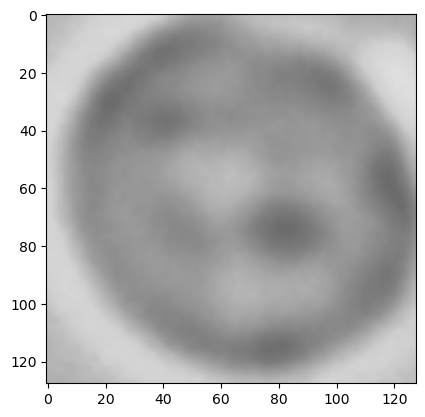

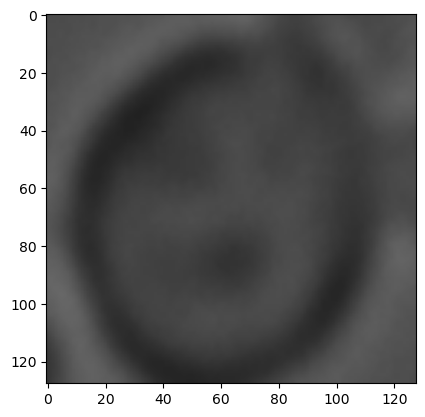

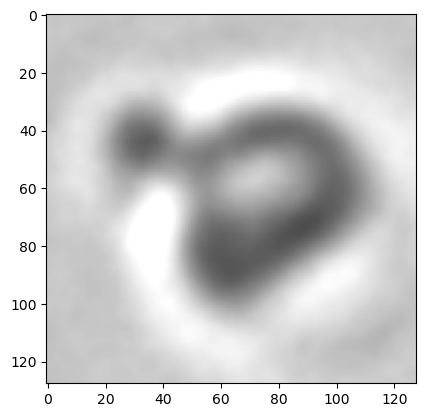

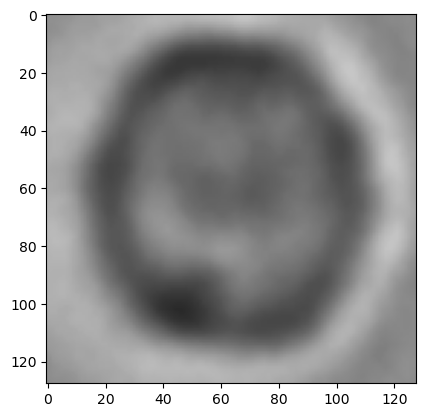

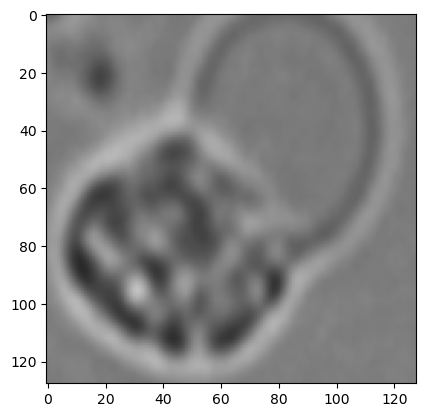

...

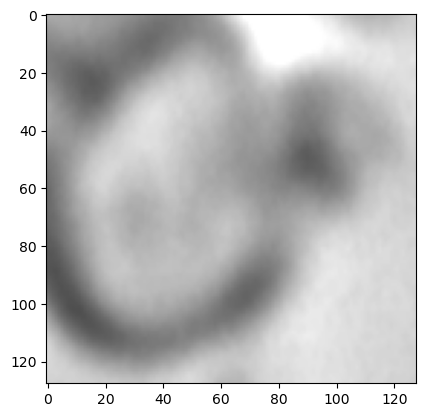

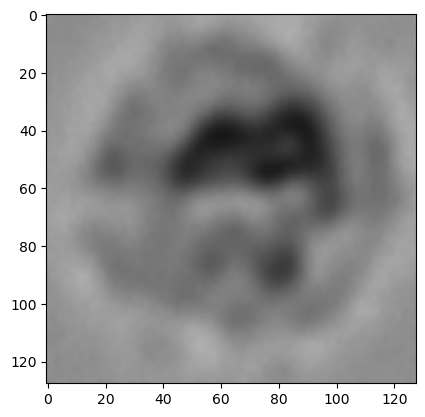

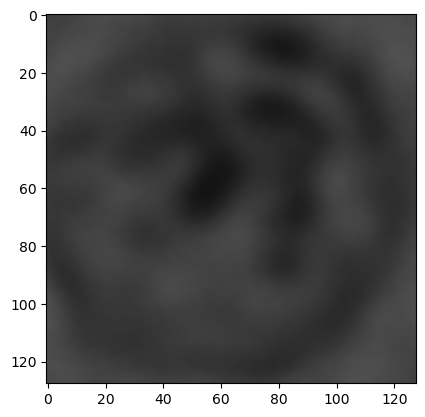

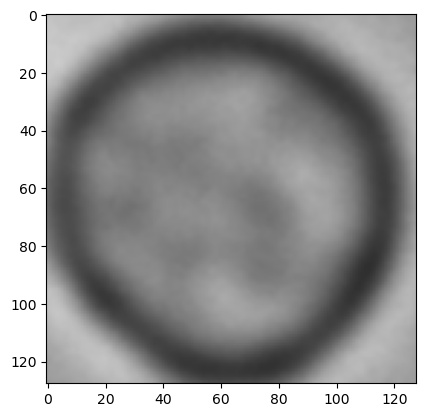

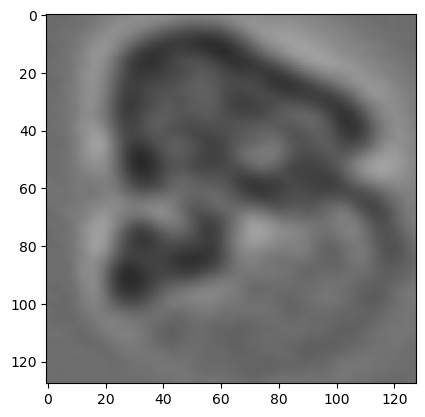

KeyboardInterrupt: 

In [246]:
for batch in loader:
    x,y =batch
#     print(x.shape)
    x = x.squeeze(0)
#     print(x)
    plt.imshow(x)
    plt.show()